In [19]:
# Import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')

from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from yellowbrick.cluster import KElbowVisualizer as kv
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
np.random.seed(42)

### Get the data

In [2]:
data = pd.read_csv('../data/processed/data_for_modeling.csv')
data.head()

,ohe_encoder__x0_Basic,ohe_encoder__x0_Master,ohe_encoder__x0_PhD,ohe_encoder__x1_Married,ohe_encoder__x1_Single,ohe_encoder__x1_Together,ohe_encoder__x1_Widow,ohe_encoder__x2_CA,ohe_encoder__x2_DE,ohe_encoder__x2_IN,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Age,HasKid,HasTeen
0,-0.158444,-0.584857,-0.524694,-0.795062,-0.525397,-0.589047,-0.188938,-0.369592,-0.235646,-0.265308,...,-0.282531,-0.283466,-0.280655,-0.262358,-0.117444,2.370996,-0.095673,-0.093624,-0.853262,-0.967424
1,-0.158444,-0.584857,-0.524694,-0.795062,1.903324,-0.589047,-0.188938,2.705689,-0.235646,-0.265308,...,-0.282531,-0.283466,-0.280655,-0.262358,8.514693,2.370996,-0.095673,0.675400,-0.853262,-0.967424
2,-0.158444,-0.584857,-0.524694,1.257763,-0.525397,-0.589047,-0.188938,-0.369592,-0.235646,-0.265308,...,-0.282531,-0.283466,-0.280655,-0.262358,-0.117444,-0.421764,-0.095673,0.931742,-0.853262,1.033673
3,-0.158444,-0.584857,-0.524694,-0.795062,-0.525397,1.697658,-0.188938,-0.369592,-0.235646,-0.265308,...,-0.282531,-0.283466,-0.280655,-0.262358,-0.117444,-0.421764,-0.095673,0.162718,1.171973,1.033673
4,-0.158444,-0.584857,-0.524694,-0.795062,1.903324,-0.589047,-0.188938,-0.369592,-0.235646,-0.265308,...,3.539436,-0.283466,-0.280655,-0.262358,-0.117444,2.370996,-0.095673,-1.717119,1.171973,-0.967424


Because we have a lot of columns, we'll try to split the data into several groups like customer's, the amount of product consumed, purchasing behaviour, and marketing campaign performance and then fit clustering model on each group

In [4]:
list(data.columns)

['ohe_encoder__x0_Basic',
 'ohe_encoder__x0_Master',
 'ohe_encoder__x0_PhD',
 'ohe_encoder__x1_Married',
 'ohe_encoder__x1_Single',
 'ohe_encoder__x1_Together',
 'ohe_encoder__x1_Widow',
 'ohe_encoder__x2_CA',
 'ohe_encoder__x2_DE',
 'ohe_encoder__x2_IN',
 'ohe_encoder__x2_ME',
 'ohe_encoder__x2_SA',
 'ohe_encoder__x2_SP',
 'ohe_encoder__x2_US',
 'Income',
 'Days_Since_Enrolled',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Response',
 'Complain',
 'Age',
 'HasKid',
 'HasTeen']

### Profile-based clustering

In [3]:
profile_cols = ['ohe_encoder__x0_Basic',
 'ohe_encoder__x0_Master',
 'ohe_encoder__x0_PhD',
 'ohe_encoder__x1_Married',
 'ohe_encoder__x1_Single',
 'ohe_encoder__x1_Together',
 'ohe_encoder__x1_Widow',
 'ohe_encoder__x2_CA',
 'ohe_encoder__x2_DE',
 'ohe_encoder__x2_IN',
 'ohe_encoder__x2_ME',
 'ohe_encoder__x2_SA',
 'ohe_encoder__x2_SP',
 'ohe_encoder__x2_US',
 'Income',
 'Days_Since_Enrolled',
 'Recency',
 'Age',
 'HasKid',
 'HasTeen']

profile_data = data[profile_cols]

In [4]:
pca = PCA()
X_pca = pca.fit_transform(profile_data)

Text(0.5, 1.0, 'Explained Variance per Principal Component')

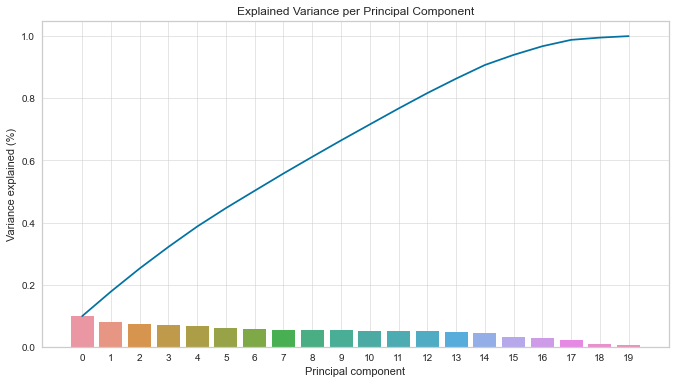

In [5]:
num_components = len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, ci=None)
ax2 = sns.lineplot(ind, cumvals, ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel('Principal component')
ax.set_ylabel('Variance explained (%)')
plt.title('Explained Variance per Principal Component')

In [7]:
num_components = len(cumvals[cumvals <= 0.8])

# Rerun PCA with components that explain 80% of the variance
pca = PCA(num_components)
X_pca = pca.fit_transform(profile_data)
X_pca = pd.DataFrame(X_pca)

X_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,-0.894470,-0.697994,-0.462164,0.887238,-0.943939,-0.920857,-0.920791,-0.973747,0.553369,-0.000043,-0.681922,0.203261
1,-0.227553,1.623371,0.241775,2.275940,-0.696322,1.748791,-1.735835,-1.728822,-0.128344,0.184442,-0.880418,-0.276558
2,-1.489696,0.290229,1.904161,0.762686,0.031865,0.926132,0.650126,1.002273,0.220809,-3.621859,0.090123,1.442903
3,0.486449,1.056000,-0.491135,-1.864451,0.824925,0.726358,-0.346245,-0.969064,0.657544,-0.384583,-0.959516,0.951267
4,2.749085,-0.598853,-1.352985,1.349071,-0.073028,0.188176,-0.026345,-1.616996,0.390985,-0.139656,-1.305516,0.626482


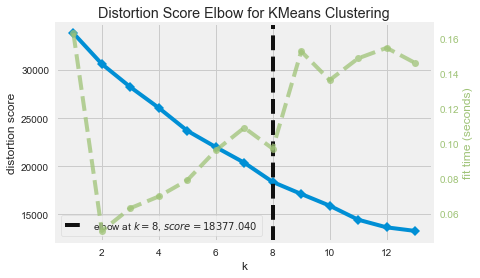

In [14]:
# Elbow method using distortion score
model = KMeans()
visualizer = kv(model, k=(1, 14))

visualizer.fit(X_pca)
visualizer.show();

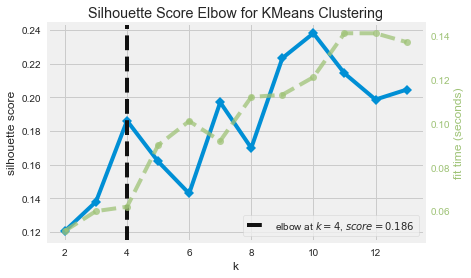

In [16]:
# Elbow method with silhoutte score
model = KMeans()
visualizer = kv(model, k=(2, 14), metric='silhouette')

visualizer.fit(X_pca)
visualizer.show();

In [17]:
model = KMeans(n_clusters=4).fit(X_pca)
kmeans_clusters = model.predict(X_pca)

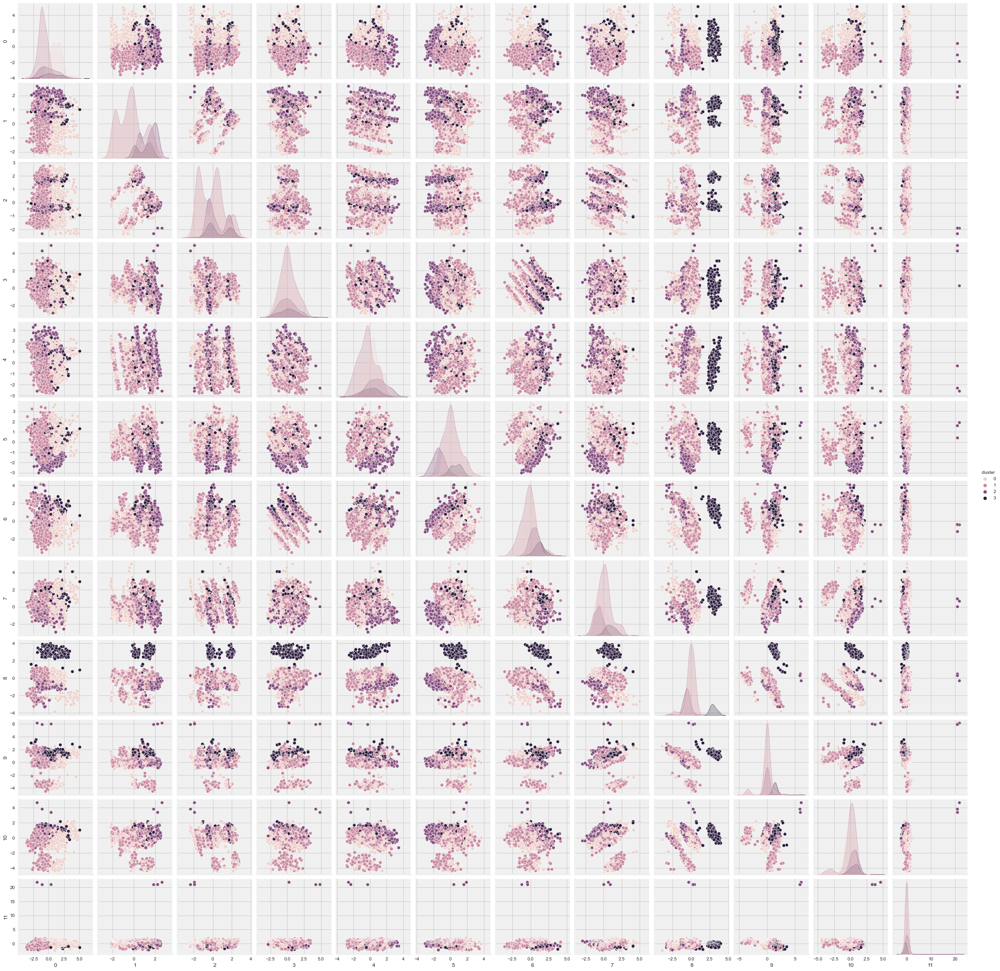

In [18]:
df = X_pca.copy()
df['cluster'] = kmeans_clusters
sns.pairplot(df, hue='cluster');

By using **KMeans**, we got 4 clusters

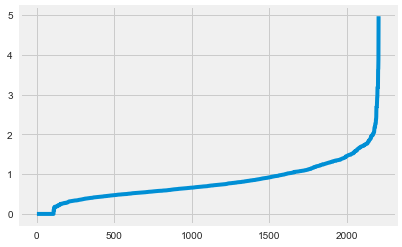

In [20]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_pca)
distances, indices = nbrs.kneighbors(X_pca)

distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances);

In [21]:
model = DBSCAN(eps=2.5, min_samples=25)
dbscan_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(dbscan_clusters)))

Number of clusters: 7


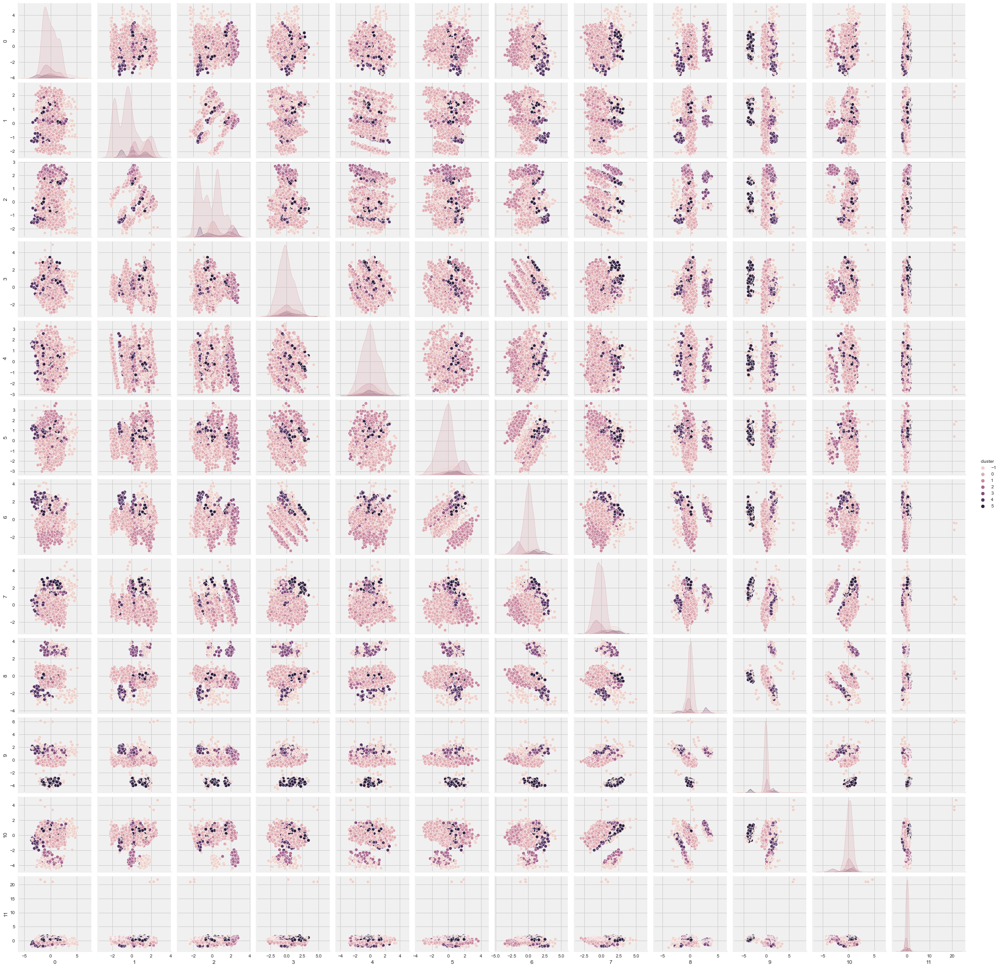

In [23]:
df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 8


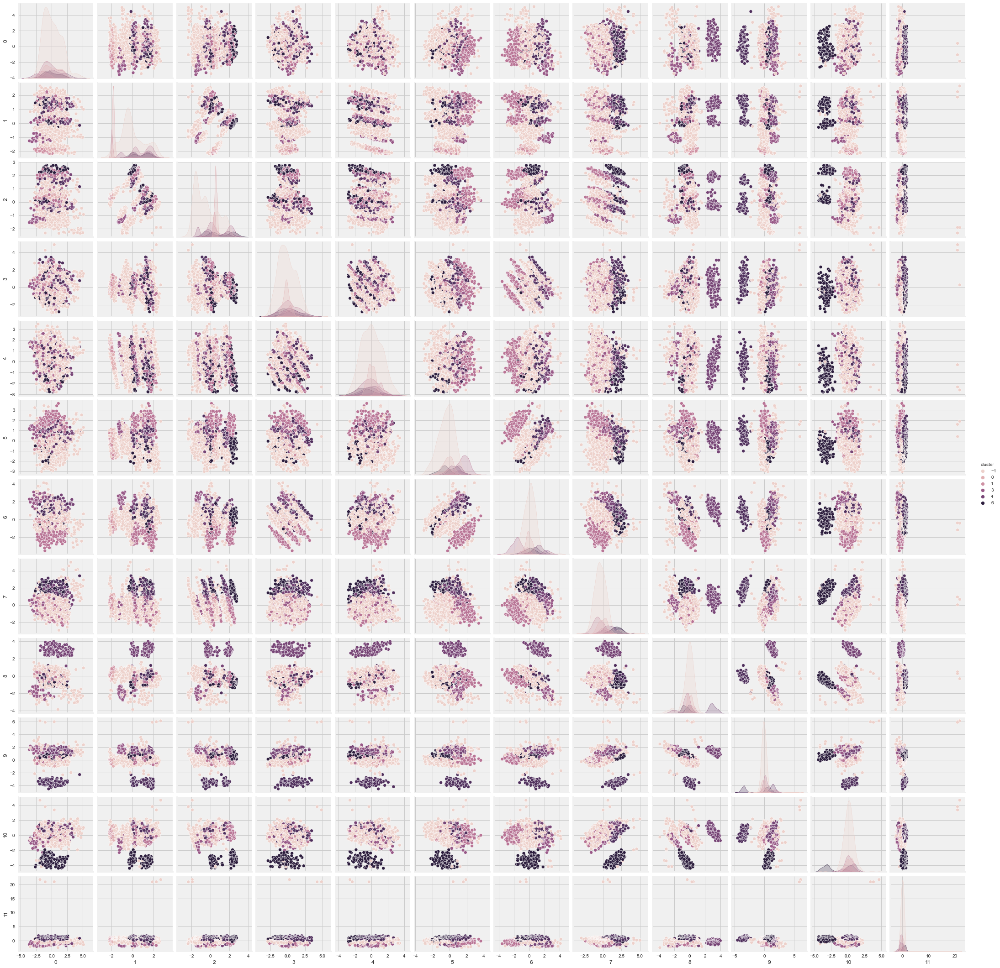

In [28]:
model = OPTICS(min_samples=25)
optics_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(optics_clusters)))

df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster');